<a href="https://colab.research.google.com/github/gdscbpdc/gdscbpdc.github.io/blob/main/5_Q_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Q-Learning


## 1. What is Q-learning?
 
### 1.1 Definition
Q-learning is an unsupervised learning technique where an AI will interact with a given environment and over time, will learn the optimal actions it can take in this environment.
 
### 1.2 Advantages of Q-learning
1. Q-learning is one of a few types of learning that can cause the AI to consider the future impacts of it's actions and not just the short-term gains.
2. As this is an unsupervised learning technique, we do not need to have any idea of how to solve the problem. So long as we can define what outcomes are favorable and not favorable, the model can learn by itself.
3. Even if we can solve a task (like tic-tac-toe for example) using traditional AI, q-learning models run incredibly fast once trained and will take a fraction of the computational power to run.

## 2. Fundamental Building Blocks

To successfully implement q-learning to solve a problem, we need the following things:<br>


  1. Observation Space <br>
      This is the way we define the current state of the environment. This     is      normally an array of numbers with upper and lower bounds for each number.<br>
  2. Action Space<br>
        How many actions the agent can take at any given state. Note that the actions being taken do not matter here, we only care about how many distinct actions can be taken.<br>
  3. Reward Function<br>
        This function is used to evaluate the actions of the agent. More specifically, the agent will take an action and this function will return the 'reward' of this action. This reward is a number that indicates how good or bad an action is. The agent will always try to optimize for the highest reward value possible.<br>


In [ ]:
# Installing the required libraries
!pip install kaggle_environments tqdm
!pip install vec_noise
!pip install pettingzoo
! pip install pygame

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 8.3 MB/s 
     |████████████████████████████████| 62 kB 576 kB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 134 kB 8.1 MB/s 
  Created wheel for vec-noise: filename=vec_noise-1.1.4-cp37-cp37m-linux_x86_64.whl size=80743 sha256=b8498fcc6f3ec5b9163dc8c1ac2f5d562a563afb4fff943475eb644ba8af392e
  Stored in directory: /root/.cache/pip/wheels/fc/0c/19/5932b4834cf3204ed2ae845e788f07c79b3279c302d55d6fa8
Successfully built vec-noise
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 816 kB 7.9 MB/s 
     |████

In [ ]:
from kaggle_environments import make # Installs the Environment
import numpy as np # For fast computations
import matplotlib.pyplot as plt # To plot graphs
from tqdm import tqdm # For progress bars

## 3. Our Environment 
Today we will be using the common game of tic-tac-toe to demonstrate q-learning. The kaggle environments library has an inbuilt environment with an inbuilt GUI and so we will begin by using this environment. Let us begin by exploring the basics of this environment.

In [ ]:
env = make("tictactoe", debug = True) # Create the environment 

### 3.1 Environment Specifications
Below we can see the environment's observation and action spaces.

In [ ]:
# View the required specifications of the environment
print("Observation Space :", env.specification.observation['board'])
print("Action Space :", env.specification.action)
print("Reward Space :", env.specification.reward)

Observation Space : {'description': 'Serialized 3x3 grid. 0 = Empty, 1 = X, 2 = O', 'type': 'array', 'shared': True, 'default': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'minItems': 9, 'maxItems': 9}
Action Space : {'description': 'Position to place a mark on the board.', 'type': 'integer', 'minimum': 0, 'maximum': 8, 'default': 0}
Reward Space : {'description': '-1 = Lost, 0 = Draw/Ongoing, 1 = Won', 'enum': [-1, 0, 1], 'default': 0, 'type': ['number', 'null']}


### 3.2 Environment Players and GUI
This environment also has some inbuilt players that play the game. We can set this to 'random' or 'reaction'. The 'random' player makes completely random moves whereas the 'reaction' player makes better but suboptimal plays. The goal of our AI is to be able to outperform both of these players.
<br>
<br>
To utilize the GUI of this library we need to specify two players and it will create a visualization of the game based on the actions of the respective players.

In [ ]:
env.reset() # Create a new game
env.run(['random', "reaction"]) # Run the random player against the reaction player
env.render(mode = "ipython")

## 4. The Q-Learning Model

### 4.1 Basics of Q-learning
Q-learning takes a simple yet powerful approach to learning from an environment. We can break this process down into these steps: <br>

1. Create a dictionary that maps observations to an array of action scores.
2. Observe the environment.
3. If we have seen this state before, perform the action with the highest score. Otherwise take a random action.
4. Look at the feedback (reward).
5. If the reward is positive this action will be encouraged when we see this state again. If not, the action is discouraged.
6. Store the observations and their corresponding action values (also known as q-values) in the dictionary.
7. Repeat the steps 2 - 6.
8. Additionally with a probability of epsilon, take a random action instead of the action with the highest value. This is done to encourage the model to try new approaches to the problem and potentially discover better solutions.

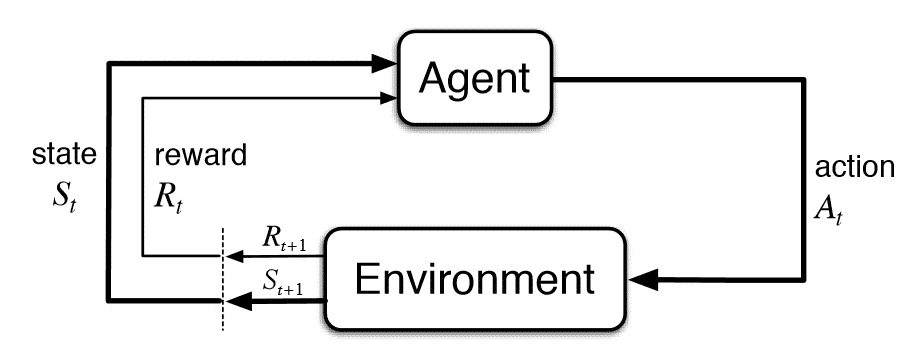

### 4.2 Hyper-Parameters

The AI is created with the following parameters that dictate various aspects of it's learning process.
1. Epsilon : This is a number between 0 and 1. It is the probability that the agent will take random actions in order to try new approaches. We often decay this value over time since the model should be getting better after it has already tried many different actions.
2. Decay : This is the rate by which epsilon will decay over time. The exact formula for this is 

```
epsilon = epsilon * decay_rate
``` 
This value must be between 0 and 1.
3. Alpha : This is the learning rate of the model. It determines how quickly the agent will learn from new information. The ideal learning rate will allow the AI to learn fast enough to be useful, but not so fast that it instantly discards previous information. This must be a positive number.
4. Discount : This is the percentage of weightage the AI gives to potential future rewards vs current rewards.



### 4.3 Putting it all together 

The final step to completing the AI is to define how it will learn from a reward. This is done by adding the current rewards and potential future rewards the AI can achieve. 

The current reward is simply the q-value of that action.

The future reward is calculated using a combination of the largest q-value of the environment state after this action has been taken as well as all of our hyper-parameters.

Below is an illustration of this equation.

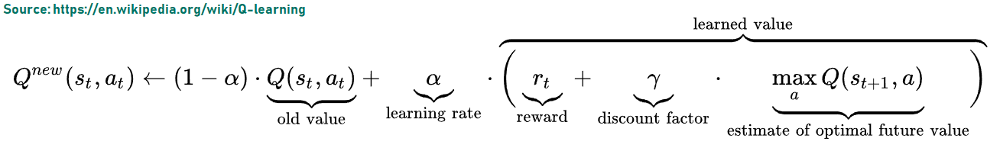

Below is a python class that implements q_learning for a tic-tac-toe game. This code will be almost the same for every problem you can take, the only difference would be how you decide which actions are invalid. For tic-tac-toe this is simply saying that we cannot put a piece on a space that is not blank. To prevent the model from taking such a move, we mark the q-value of this action as -1000.

In [ ]:
class Agent:
    def __init__(self, num_actions, epsilon = 0.5, decay = 0.995, alpha = 0.1, discount = 0.999999):
        self.q_table = {} # This is the memory of the AI
        
        self.epsilon = epsilon # Probability of random action [0 - 1]
        self.decay = decay # epsilon decay [0 - 1]
        self.alpha = alpha # learning rate [0 - inf]
        self.discount = discount # how much importance is given to future states [0 - 1]
        self.num_actions = num_actions
    
    def get_action(self, obs): # look at the environmental and choose an action
        obs = tuple(obs)
        while True:

            if obs not in self.q_table:
                self.q_table[obs] = np.random.random(self.num_actions)

            action = np.argmax(self.q_table[obs])

            if np.random.random() < self.epsilon:
                action = np.random.randint(0, self.num_actions)
            
            if obs[action] != 0:
                self.q_table[obs][action] = -1000
                continue
            # type is returned as <class 'numpy.int64'> by default, so we convert to int
            return int(action)
    
    def update_q_table(self, obs, action, new_obs, reward):   
        obs = tuple(obs)
        new_obs = tuple(new_obs)
        
        max_future_q = self.get_max_future_q(new_obs)
        
        current_q = self.q_table[obs][action]
        
        current_reward = ((1 - self.alpha) * current_q)
        future_reward = (self.alpha * (reward + self.discount * max_future_q))
        self.q_table[obs][action] = current_reward + future_reward
        
    
    def get_max_future_q(self, obs):
        obs = tuple(obs)
        if obs not in self.q_table:
            self.q_table[obs] = np.random.random(self.num_actions)
        
        return np.max(self.q_table[obs])

### 4.4 Running the Training Loop

Below is python code that implements the training loop as described above.

We use the kaggle environments for this training. Every action we take returns a new observation and reward which allows us to learn appropriately. Here we are training our AI by having it play 5000 games against the 'reaction' player.

In [ ]:
env = make("tictactoe", debug = True) # Create the environment 

agent = Agent(9) # Agent that can take one of nine possible actions
episodes = 5000 # Train for 5000 episodes

show_every = 100 # Display model progress every 100 episodes

deacy_after = 400 # Decay epsilon after some amount of iterations


trainer = env.train([None, "reaction"]) # train against 'reaction' or 'random' agent
rewards = []
epsilon_values = []

In [ ]:

for episode_no in range(episodes):
    episode_reward = 0
    
    obs = trainer.reset() # Reset the board
    done = False # Checks if the game has ended
    while not done:
        action = agent.get_action(obs['board']) # get an action from the agent
        
        past_board = obs['board'].copy()
        
        obs, reward, done, info = trainer.step(action) # Play the move and get the reward
        episode_reward += reward
        agent.update_q_table(past_board, action, obs['board'], reward) # Tells the AI to learn based on the reward
        
        if episode_no >= deacy_after:
            agent.epsilon *= agent.decay # Decay epsilon
    
    epsilon_values.append(agent.epsilon)
    rewards.append(reward)
    if episode_no % show_every == 0: # Display Results of Previous 100 Episodes
        batch = list(rewards[-show_every:])
        print(f"{show_every} episode mean score is {np.mean(batch)}.")
        print(f"Wins : {batch.count(1)}, Draws : {batch.count(0)}, Losses : {batch.count(-1)}")

100 episode mean score is 0.33.
Wins : 35, Draws : 63, Losses : 2
100 episode mean score is 0.34.
Wins : 35, Draws : 64, Losses : 1
100 episode mean score is 0.4.
Wins : 41, Draws : 58, Losses : 1
100 episode mean score is 0.37.
Wins : 38, Draws : 61, Losses : 1
100 episode mean score is 0.4.
Wins : 40, Draws : 60, Losses : 0
100 episode mean score is 0.46.
Wins : 46, Draws : 54, Losses : 0
100 episode mean score is 0.43.
Wins : 44, Draws : 55, Losses : 1
100 episode mean score is 0.41.
Wins : 41, Draws : 59, Losses : 0
100 episode mean score is 0.34.
Wins : 35, Draws : 64, Losses : 1
100 episode mean score is 0.47.
Wins : 48, Draws : 51, Losses : 1
100 episode mean score is 0.34.
Wins : 34, Draws : 66, Losses : 0
100 episode mean score is 0.33.
Wins : 33, Draws : 67, Losses : 0
100 episode mean score is 0.39.
Wins : 39, Draws : 61, Losses : 0
100 episode mean score is 0.36.
Wins : 36, Draws : 64, Losses : 0
100 episode mean score is 0.37.
Wins : 37, Draws : 63, Losses : 0
100 episode 

### 4.5 Evaluating the Performance

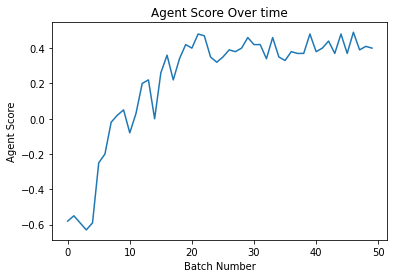

In [ ]:
# Plot the rewards per batch over time

list_progression = [rewards[i:i + show_every] for i in range(0, len(rewards), show_every)]
list_progression = [sum(i)/len(i) for i in list_progression]
plt.plot(list_progression)
plt.xlabel("Batch Number")
plt.ylabel("Agent Score")
plt.title("Agent Score Over time")
plt.show()

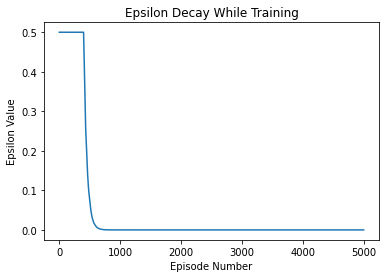

In [ ]:
# Plot the decay in epsilon over time

plt.plot(range(len(epsilon_values)), epsilon_values)
plt.xlabel("Episode Number")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay While Training")
plt.show()

Below we create a function that takes an observation and returns the action our AI would have taken. This is then passed into our environment's GUI.

In [ ]:
def run_agent(obs): # Create a function to extract the board from the environment and get the coresponding action
    return agent.get_action(obs["board"])


env.reset()
env.run([run_agent, "reaction"]) # Run the AI against the inbuilt player
env.render(mode = "ipython")

## 5. Alternate Method to Train our AI

The previous AI relied on the fact that we have an existing program it can play against.

A potential way to achieve a different (and potentially better) AI is to simply create two AI's and train them by having them play multiple games against each other. This will allow us to learn without any pre-existing program that we can run against. 

Note that this method takes exponentially longer to train. Infact, even in the demo given below these AI's play 50,000 games against each other but have not reached the level of the first AI. This is because we need to first train them to learn the game properly which in and of itself can take millions of episodes of training. As we will see, it is far better to have even a rudimentary program which we can play against in order to learn.

To do this we have implemented the game using python code. Below is a numpy optimized version of the reward function of the kaggle environment.

In [ ]:
# Create a Custom Rewards function
def get_reward(board, turn):
    board = np.array(board).reshape((3, 3))
    
    # Row Check
    if np.any(np.all(board == 1, axis = 1)):
        if turn == 1:
            return 1
        else:
            return -1
    
    # Column check
    if np.any(np.all(board == 1, axis = 0)):
        if turn == 1:
            return 1
        else:
            return -1
    
    # Diagonals check
    if board[0][0] == 1 and board[1][1] == 1 and board[2][2] == 1:
        if turn == 1:
            return 1
        else:
            return -1
        
    if board[0][2] == 1 and board[1][1] == 1 and board[2][0] == 1:
        if turn == 1:
            return 1
        else:
            return -1
    
    
    # Row Check
    if np.any(np.all(board == 2, axis = 1)):
        if turn == 1:
            return -1
        else:
            return 1
    
    # Column check
    if np.any(np.all(board == 2, axis = 0)):
        if turn == 1:
            return -1
        else:
            return 1
    
    # Diagonals check
    if board[0][0] == 2 and board[1][1] == 2 and board[2][2] == 2:
        if turn == 1:
            return -1
        else:
            return 1
        
    if board[0][2] == 2 and board[1][1] == 2 and board[2][0] == 2:
        if turn == 1:
            return -1
        else:
            return 1
    
    return 0

Below is the training loop with the two AI's pitted against each other.

In [ ]:
agent1 = Agent(9, epsilon = 0.5, decay = 0.99999, alpha = 0.1, discount = 0.999999)
agent2 = Agent(9, epsilon = 0.5, decay = 0.99999, alpha = 0.1, discount = 0.999999)
episodes = 50_000

deacy_after = 10_000 # Decay epsilon after some amount of iterations

for episode_no in tqdm(range(episodes)):
    obs = np.zeros((9, ))
    done = False # Checks if the game has ended
    turn = 1 # Which player's turn it is
    while not done:
        if turn == 1:
            action = agent1.get_action(obs) # get an action from the agent
        else:
            action = agent2.get_action(obs) # get an action from the agent
        
        past_board = obs.copy()
        
        obs[action] = turn
        
        reward = get_reward(obs, turn)
        if reward != 0 or np.all(obs != 0):
            done = True
        
        if turn == 1:
            agent1.update_q_table(past_board, action, obs, reward) # Tells the AI to learn based on the reward
            turn = 2
        else:
            agent2.update_q_table(past_board, action, obs, reward) # Tells the AI to learn based on the reward
            turn = 1
        
    if episode_no >= deacy_after:
        agent1.epsilon *= agent1.decay # Decay epsilon
        agent2.epsilon *= agent2.decay # Decay epsilon

100%|██████████| 500000/500000 [05:04<00:00, 1640.01it/s]


In [ ]:
def run_agent1(obs): # Create a function to extract the board from the environment and get the coresponding action
    return agent1.get_action(obs["board"])
def run_agent2(obs): # Create a function to extract the board from the environment and get the coresponding action
    return agent2.get_action(obs["board"])


env.reset()
env.run([run_agent1, run_agent2]) # Run the AI's against themselves
env.render(mode = "ipython")

We can now run the new AI against the old trainer and see the results.

In [ ]:

trainer = env.train([None, "reaction"]) # train against 'reaction' or 'random' agent
rewards = []
for episode_no in range(100):
    episode_reward = 0
    
    obs = trainer.reset() # Reset the board
    done = False # Checks if the game has ended
    while not done:
        action = agent1.get_action(obs['board']) # get an action from the agent
        
        past_board = obs['board'].copy()
        
        obs, reward, done, info = trainer.step(action) # Play the move and get the reward
        episode_reward += reward
        agent1.update_q_table(past_board, action, obs['board'], reward) # Tells the AI to learn based on the reward
        
        if episode_no >= deacy_after:
            agent.epsilon *= agent.decay # Decay epsilon
    
    rewards.append(reward)

print(f"The new mean score is {np.mean(rewards)}.")
print(f"Wins : {rewards.count(1)}, Draws : {rewards.count(0)}, Losses : {rewards.count(-1)}")

The new mean score is -0.49.
Wins : 13, Draws : 25, Losses : 62
